<a id='1'></a>
## 1 - Loading the libraries

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import folium
from folium.plugins import HeatMap
from IPython.display import display

In [4]:
pd.set_option('display.max_columns', 300) #Setting column display limit

<a id='2'></a>
## 2 - Loading the dataset

In [5]:
fraud_df = pd.read_csv("../data/synthetic_fraud_transactions.csv")
fraud_df.head(1)

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO
0,0,2018-04-01 00:00:31,596,3156,57.16,31,0,0,0


In [11]:
len(fraud_df[fraud_df["TX_FRAUD"] == 1])

14681

In [11]:
customer_df = pd.read_csv("../data/customer_profiles.csv")

display(customer_df.head())

,CUSTOMER_ID,x_customer_id,y_customer_id,mean_amount,std_amount,mean_nb_tx_per_day,nb_terminals
0,0,54.881350,71.518937,62.262521,31.131260,2.179533,78
1,1,42.365480,64.589411,46.570785,23.285393,3.567092,85
2,2,96.366276,38.344152,80.213879,40.106939,2.115580,70
3,3,56.804456,92.559664,11.748426,5.874213,0.348517,70
4,4,2.021840,83.261985,78.924891,39.462446,3.480049,65


<a id='3'></a>
## 3 - Exploring Dataset

<a id='3-1'></a>
### 3.1 - Data Integrity

In [15]:
print(f"# Rows = {customer_df.shape[0]}\n# Columns = {customer_df.shape[1]}")

# Rows = 5000
# Columns = 7


In [16]:
customer_df.info(verbose = True)

<class 'pandas.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CUSTOMER_ID         5000 non-null   int64  
 1   x_customer_id       5000 non-null   float64
 2   y_customer_id       5000 non-null   float64
 3   mean_amount         5000 non-null   float64
 4   std_amount          5000 non-null   float64
 5   mean_nb_tx_per_day  5000 non-null   float64
 6   nb_terminals        5000 non-null   int64  
dtypes: float64(5), int64(2)
memory usage: 273.6 KB


In [17]:
customer_df.describe()

,CUSTOMER_ID,x_customer_id,y_customer_id,mean_amount,std_amount,mean_nb_tx_per_day,nb_terminals
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2499.500000,49.626386,50.013166,51.797573,25.898787,1.977582,75.207800
std,1443.520003,28.991158,29.081224,27.779156,13.889578,1.154736,12.412874
min,0.000000,0.007245,0.020695,5.032382,2.516191,0.000295,22.000000
25%,1249.750000,24.417225,24.808494,27.885592,13.942796,0.977653,69.000000
50%,2499.500000,49.462662,50.073791,51.681424,25.840712,1.952286,77.000000
75%,3749.250000,74.615700,75.910068,75.633210,37.816605,2.996354,83.000000
max,4999.000000,99.996202,99.996402,99.981815,49.990907,3.999912,106.000000


# Feature Description Table

| Feature        | Meaning |
|----------------|--------|
| Customer_ID    | A unique numerical identifier assigned to each cardholder. |
| x_customer_id  | The spatial X-coordinate of the customer's primary billing address. |
| y_customer_id  | The spatial Y-coordinate of the customer's primary billing address. | 
| mean_amount  | The average monetary value of a transaction for this specific customer. |
| std_amount | The standard deviation (variance) of the customer's transaction amounts. |
| mean_nb_tx_per_day | The average number of transactions this customer makes in a single 24-hour period. |
| nb_terminals       | The number of distinct payment terminals (merchants/POS systems) the customer typically interacts with or has access to locally. |

<a id='3-1-1'></a>
#### 3.1.1 - Completeness

In [18]:
customer_df.isnull().sum()

CUSTOMER_ID           0
x_customer_id         0
y_customer_id         0
mean_amount           0
std_amount            0
mean_nb_tx_per_day    0
nb_terminals          0
dtype: int64

<a id='3-1-2'></a>
#### 3.1.2 - Uniqueness

In [19]:
customer_df.duplicated().sum()

np.int64(0)

In [20]:
customer_df["CUSTOMER_ID"].duplicated().sum()

np.int64(0)

<a id='3-1-3'></a>
#### 3.1.3 - Accuracy

In [21]:
cols = [
    "mean_amount",
    "std_amount",
    "mean_nb_tx_per_day",
    "nb_terminals"
]

# check if any negative values exist in each column
negative_check = (customer_df[cols] < 0).any()

print(negative_check)

mean_amount           False
std_amount            False
mean_nb_tx_per_day    False
nb_terminals          False
dtype: bool


<a id='3-1-4'></a>
#### 3.1.4 - Validity

In [22]:
customer_df.dtypes

CUSTOMER_ID             int64
x_customer_id         float64
y_customer_id         float64
mean_amount           float64
std_amount            float64
mean_nb_tx_per_day    float64
nb_terminals            int64
dtype: object

<a id='3-2'></a>
### 3.2 - Spending Behavior

<a id='3-2-1'></a>
#### 3.2.1 - Distribution of Spend

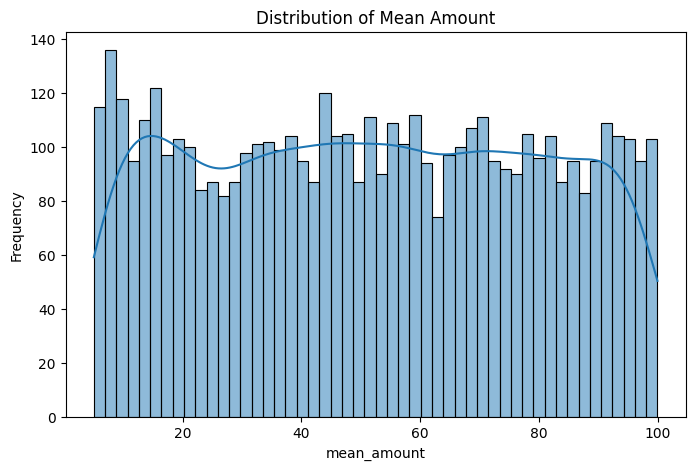

In [27]:
plt.figure(figsize=(8, 5))
sns.histplot(customer_df["mean_amount"], bins=50, kde=True)

plt.title("Distribution of Mean Amount")
plt.xlabel("mean_amount")
plt.ylabel("Frequency")
plt.show()

X-axis: the average amount spent by each customer.
Y-axis: the number of customers falling into each spending group.

From the distribution of customers’ average spending, we can see that it is relatively flat or nearly uniform with a **mean ≈ 50**. In real-world scenarios, spending behavior is typically right-skewed, since most customers make small transactions, while a small fraction account for very large purchases.

Usually, customer spending is concentrated in a low-value cluster (e.g., daily expenses such as coffee, food, and transport), followed by a long tail of rare but high-value transactions (e.g., electronics, travel, luxury goods, or business payments).

However, because this dataset is synthetic, it is likely that each transaction was sampled from a uniform distribution in the range of **$5 to $100**, which naturally produces an average spending value around $50 and results in a flatter distribution.

<a id='3-2-2'></a>
#### 3.2.2 - Customer's Average Spend and their Spending Volatility

In [28]:
corr = customer_df["std_amount"].corr(customer_df["mean_amount"])
print("Correlation between std_amount and mean_amount:", corr)

Correlation between std_amount and mean_amount: 0.9999999999999999


The correlation between the average spending of a customer and the variability of their transaction amounts shows a **perfect positive linear relationship**. In this case, as a customer’s average spending increases by $10, their standard deviation increases proportionally, approximately following the rule:

$$
\sigma \propto \frac{\mu}{2}
$$

This implies that higher-spending customers tend to have more variable spending patterns, while lower-spending customers exhibit more stable and consistent transaction amounts.

From a machine learning perspective, this means the two features are highly redundant. Since one feature can be almost directly inferred from the other, they exhibit strong collinearity and do not provide additional independent information to the model. As a result, including both features would not significantly improve model performance and may introduce unnecessary redundancy.

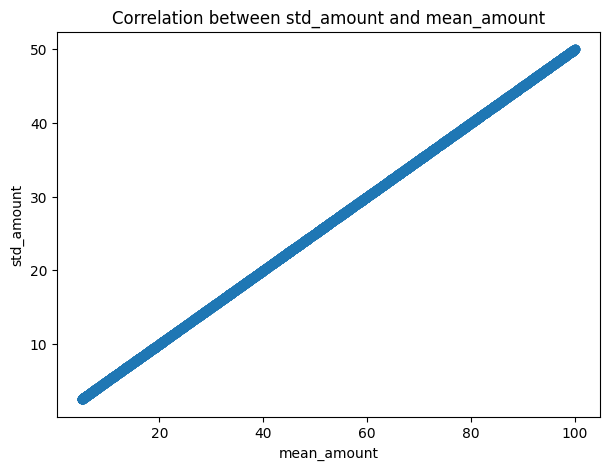

In [34]:
plt.figure(figsize=(7, 5))

sns.regplot(
    data=customer_df,
    x="mean_amount",
    y="std_amount",
    scatter_kws={"alpha": 0.9}
)

plt.title("Correlation between std_amount and mean_amount")
plt.xlabel("mean_amount")
plt.ylabel("std_amount")

plt.show()

<a id='3-2-3'></a>
#### 3.2.3 - Transaction Frequency

In [38]:
summary = {
    "mean": customer_df["mean_nb_tx_per_day"].mean(),
    "p99": customer_df["mean_nb_tx_per_day"].quantile(0.99),
    "median": customer_df["mean_nb_tx_per_day"].median()
}

display(summary)

{'mean': np.float64(1.9775818760991017),
 'p99': np.float64(3.9626933983480384),
 'median': np.float64(1.952286369880131)}

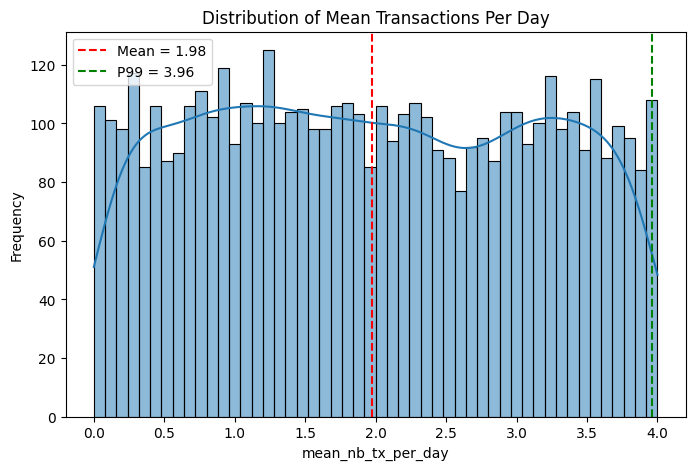

In [40]:
# compute stats
mean_val = summary["mean"]
p99_val = summary["p99"]

plt.figure(figsize=(8, 5))

# distribution
sns.histplot(customer_df["mean_nb_tx_per_day"], bins=50, kde=True)

# mean line
plt.axvline(mean_val, color="red", linestyle="--", label=f"Mean = {mean_val:.2f}")

# p99 line
plt.axvline(p99_val, color="green", linestyle="--", label=f"P99 = {p99_val:.2f}")

plt.title("Distribution of Mean Transactions Per Day")
plt.xlabel("mean_nb_tx_per_day")
plt.ylabel("Frequency")

plt.legend()
plt.show()

From the following graph, we conclude that the distribution of users' average transactions per day is **uniform**, as the data is flat across the board.

Here, every customer has an average number of daily transactions randomly chosen between 0 and 4.

So, if we take the average number of daily transactions for every customer, then sum them up and divide by the total number of customers, it will give us 2 transactions per day.

And when we tried to understand the outlier customers within our data, we saw that 99% of the customers have an average of fewer than 4 transactions per day. However, the remaining 1% cannot yet be considered outliers because there is still a group of customers that lies within that range.

So now, if a customer has an average of 10 transactions per day, the system must recognize it as a red flag or suspicious activity because it is far above what almost all customers usually do.

<a id='3-3'></a>
### 3.3 - Geospatial Information

<a id='3-3-1'></a>
#### 3.3.1 - Where is the Customer's Location

In [ ]:
# create map centered around average location
m = folium.Map(
    location=[
        customer_df["y_customer_id"].mean(),
        customer_df["x_customer_id"].mean()
    ],
    zoom_start=6
)

# add customer points
for _, row in customer_df.iterrows():
    folium.CircleMarker(
        location=[row["y_customer_id"], row["x_customer_id"]],
        radius=2,
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

m.save("../assets/graphs/customer_locations.html")

# display map
display(m)

In [ ]:
# create base map
m = folium.Map(
    location=[
        customer_df["y_customer_id"].mean(),
        customer_df["x_customer_id"].mean()
    ],
    zoom_start=6
)

# prepare coordinates
heat_data = customer_df[
    ["y_customer_id", "x_customer_id"]
].dropna().values.tolist()

# add heatmap
HeatMap(heat_data).add_to(m)

m.save("../assets/graphs/customer_locations_density.html")

display(m)

In [ ]:
# create base map
m = folium.Map(
    location=[
        customer_df["y_customer_id"].mean(),
        customer_df["x_customer_id"].mean()
    ],
    zoom_start=6
)

# add circles
for _, row in customer_df.iterrows():

    folium.CircleMarker(
        location=[row["y_customer_id"], row["x_customer_id"]],
        
        # scale marker size
        radius=max(row["mean_amount"] / 20, 2),

        popup=f"Mean Amount: {row['mean_amount']:.2f}",

        fill=True,
        fill_opacity=0.6
    ).add_to(m)

m.save("../assets/graphs/customer_risk_zones.html")

display(m)

<a id='3-3-2'></a>
#### 3.3.2 - Customer's Used Terminals and their Average Spending per Day

In [58]:
corr = customer_df["nb_terminals"].corr(customer_df["mean_nb_tx_per_day"])
print("Correlation between nb_terminals and mean_nb_tx_per_day:", corr)

Correlation between nb_terminals and mean_nb_tx_per_day: 0.015939493137368463


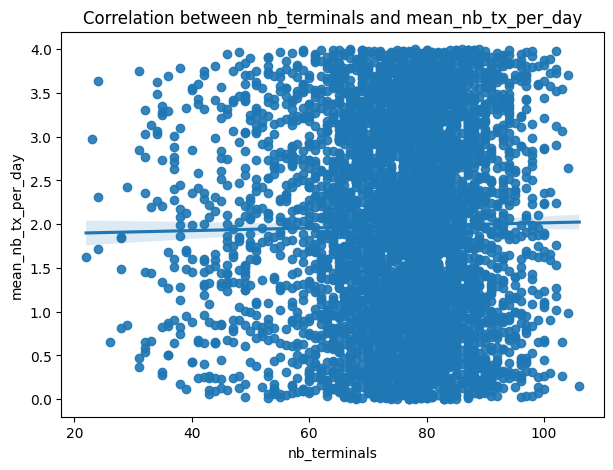

In [59]:
plt.figure(figsize=(7, 5))

sns.regplot(
    data=customer_df,
    x="nb_terminals",
    y="mean_nb_tx_per_day",
    scatter_kws={"alpha": 0.9}
)

plt.title("Correlation between nb_terminals and mean_nb_tx_per_day")
plt.xlabel("nb_terminals")
plt.ylabel("mean_nb_tx_per_day")

plt.show()

<a id='3-3-3'></a>
#### 3.3.3 - Distribution of Number of Terminals

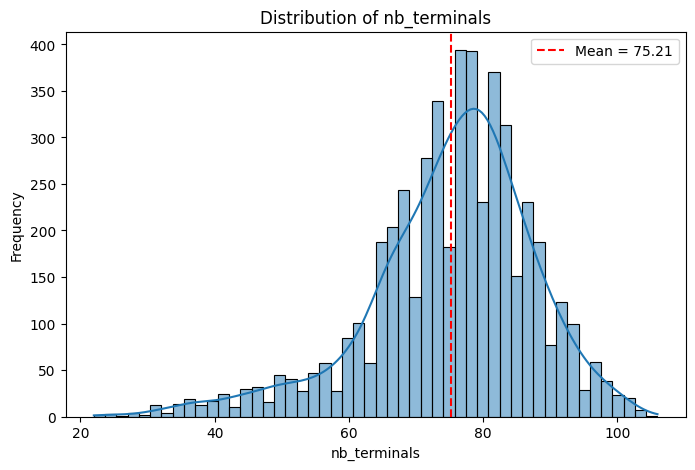

In [ ]:
mean_val = customer_df["nb_terminals"].mean()

plt.figure(figsize=(8, 5))

sns.histplot(customer_df["nb_terminals"], bins=50, kde=True)

plt.axvline(mean_val, color="red", linestyle="--", label=f"Mean = {mean_val:.2f}")

plt.title("Distribution of nb_terminals")
plt.xlabel("nb_terminals")
plt.ylabel("Frequency")

plt.legend()
plt.show()